**Installing all the requirements**

In [ ]:
pip install groundingdino-py google-generativeai pillow matplotlib opencv-python


In [ ]:
!mkdir -p weights
!wget -O weights/groundingdino_swint_ogc.pth https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth


--2025-08-10 09:32:59--  https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth
Resolving github.com (github.com)... 140.82.121.3
Connecting to github.com (github.com)|140.82.121.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://release-assets.githubusercontent.com/github-production-release-asset/611591640/f221e500-c2fc-4fd3-b84e-8ad92a6923f3?sp=r&sv=2018-11-09&sr=b&spr=https&se=2025-08-10T10%3A17%3A26Z&rscd=attachment%3B+filename%3Dgroundingdino_swint_ogc.pth&rsct=application%2Foctet-stream&skoid=96c2d410-5711-43a1-aedd-ab1947aa7ab0&sktid=398a6654-997b-47e9-b12b-9515b896b4de&skt=2025-08-10T09%3A16%3A54Z&ske=2025-08-10T10%3A17%3A26Z&sks=b&skv=2018-11-09&sig=QWVJVcOh%2FOlXXvj4lOVSOz90mHaclzJ4IzEoQnzF5GQ%3D&jwt=eyJ0eXAiOiJKV1QiLCJhbGciOiJIUzI1NiJ9.eyJpc3MiOiJnaXRodWIuY29tIiwiYXVkIjoicmVsZWFzZS1hc3NldHMuZ2l0aHVidXNlcmNvbnRlbnQuY29tIiwia2V5Ijoia2V5MSIsImV4cCI6MTc1NDgxODY3OSwibmJmIjoxNzU0ODE4Mzc5LCJwYX

In [ ]:
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cpu


Looking in indexes: https://download.pytorch.org/whl/cpu


In [ ]:
!mkdir -p config


In [ ]:
!wget -O config/GroundingDINO_SwinT_OGC.py https://raw.githubusercontent.com/IDEA-Research/GroundingDINO/main/groundingdino/config/GroundingDINO_SwinT_OGC.py


--2025-08-10 09:37:42--  https://raw.githubusercontent.com/IDEA-Research/GroundingDINO/main/groundingdino/config/GroundingDINO_SwinT_OGC.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1006 [text/plain]
Saving to: ‘config/GroundingDINO_SwinT_OGC.py’

config/GroundingDIN 100%[===================>]    1006  --.-KB/s    in 0s      

2025-08-10 09:37:43 (85.0 MB/s) - ‘config/GroundingDINO_SwinT_OGC.py’ saved [1006/1006]



**Importing modules**

In [ ]:
import torch
from groundingdino.util.inference import load_model, load_image, predict, annotate
import google.generativeai as genai
import matplotlib.pyplot as plt

/usr/local/lib/python3.11/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


**Set Gemini API Key**

In [ ]:
API_KEY = "your api key"
genai.configure(api_key=API_KEY)

**Loading the model**

In [ ]:
MODEL_CONFIG_PATH = "config/GroundingDINO_SwinT_OGC.py"
MODEL_CHECKPOINT_PATH = "weights/groundingdino_swint_ogc.pth"

model = load_model(MODEL_CONFIG_PATH, MODEL_CHECKPOINT_PATH)

/usr/local/lib/python3.11/dist-packages/torch/functional.py:554: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:4322.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


final text_encoder_type: bert-base-uncased


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

**Detection function**

In [ ]:
def detect_with_groundingdino(image_path, text_prompt):
    image_source, image = load_image(image_path)
    boxes, logits, phrases = predict(
        model=model,
        image=image,
        caption=text_prompt,
        box_threshold=0.3,
        text_threshold=0.25,
        device="cpu"
    )
    annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)
    plt.imshow(annotated_frame)
    plt.axis("off")
    plt.show()
    return boxes, phrases

**Gemini filtering**

In [ ]:
!pip install pillow


In [ ]:
import time
from google.api_core.exceptions import TooManyRequests
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch

def smart_object_detection(image_path, query_text, keep_top_n=1, save_debug_crops=False):
    """
    Complete object detection pipeline with GroundingDINO + Gemini filtering

    Args:
        image_path (str): Path to the image file
        query_text (str): What to search for (e.g., "person wearing red dress having pink polybag")
        keep_top_n (int): How many largest detections to keep before Gemini filtering
        save_debug_crops (bool): Whether to save cropped images for debugging

    Returns:
        list: Final filtered results [(box, phrase), ...]
    """

    print(f"🔍 Searching for: '{query_text}'")
    print("="*50)

    # Step 1: Resize image
    print("📏 Resizing image...")
    with Image.open(image_path) as img:
        original_size = img.size
        img.thumbnail((1024, 1024))
        img.save(image_path)
        print(f"   Resized from {original_size} to {img.size}")

    # Step 2: GroundingDINO Detection with filtering
    print(f"\n🎯 GroundingDINO Detection...")
    boxes, phrases = _detect_with_filtering(image_path, query_text, keep_top_n)

    # Step 3: Save debug crops if requested
    if save_debug_crops and len(boxes) > 0:
        print(f"\n💾 Saving debug crops...")
        _save_debug_crops(image_path, boxes, phrases)

    # Step 4: Gemini Visual Filtering
    if len(boxes) > 0:
        print(f"\n🤖 Gemini Visual Filter...")
        filtered_results = _gemini_filter(image_path, query_text, boxes, phrases)
    else:
        print("\n❌ No objects detected by GroundingDINO")
        filtered_results = []

    # Step 5: Final Results
    print("\n" + "="*50)
    if filtered_results:
        print(f"✅ SUCCESS: Found {len(filtered_results)} matching object(s)")
        for i, (box, phrase) in enumerate(filtered_results, 1):
            print(f"   {i}. {phrase}")
    else:
        print("❌ No matching objects found after filtering")

    return filtered_results

def _detect_with_filtering(image_path, query_text, keep_top_n):
    """Internal function for GroundingDINO detection with filtering"""
    image_source, image = load_image(image_path)
    boxes, logits, phrases = predict(
        model=model,
        image=image,
        caption=query_text,
        box_threshold=0.3,
        text_threshold=0.25,
        device="cpu"
    )

    print(f"   Initial detections: {len(boxes)}")

    if len(boxes) == 0:
        return [], []

    # Filter by area (keep largest N boxes)
    boxes, logits, phrases = _filter_by_area(boxes, logits, phrases, keep_top_n)
    print(f"   After filtering: {len(boxes)} detections")

    # Show visualization
    annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)
    plt.figure(figsize=(12, 8))
    plt.imshow(annotated_frame)
    plt.title(f"GroundingDINO Detection: '{query_text}' ({len(boxes)} objects)")
    plt.axis("off")
    plt.show()

    return boxes, phrases

def _filter_by_area(boxes, logits, phrases, keep_largest_n):
    """Filter boxes by area, keeping the largest N"""
    if len(boxes) <= keep_largest_n:
        return boxes, logits, phrases

    # Calculate areas and sort
    box_info = []
    for i, box in enumerate(boxes):
        if isinstance(box, torch.Tensor):
            cx, cy, w, h = box.cpu().numpy()
        else:
            cx, cy, w, h = box
        area = w * h
        box_info.append((area, i))

    # Sort by area (largest first) and keep top N
    box_info.sort(key=lambda x: x[0], reverse=True)
    keep_indices = [info[1] for info in box_info[:keep_largest_n]]

    # Filter results
    if isinstance(boxes, torch.Tensor):
        filtered_boxes = boxes[keep_indices]
        filtered_logits = logits[keep_indices]
    else:
        filtered_boxes = [boxes[i] for i in keep_indices]
        filtered_logits = [logits[i] for i in keep_indices]

    filtered_phrases = [phrases[i] for i in keep_indices]

    # Show what was kept
    for i, idx in enumerate(keep_indices):
        area = box_info[idx][0] if idx < len(box_info) else "unknown"
        print(f"   Kept: '{phrases[idx]}' (area: {area:.4f})")

    return filtered_boxes, filtered_logits, filtered_phrases

def _save_debug_crops(image_path, boxes, phrases):
    """Save cropped images for debugging"""
    img = Image.open(image_path).convert("RGB")
    img_w, img_h = img.size

    for i, box in enumerate(boxes):
        if isinstance(box, torch.Tensor):
            cx, cy, w, h = box.cpu().numpy()
        else:
            cx, cy, w, h = box

        x_min = max(0, int((cx - w / 2) * img_w))
        y_min = max(0, int((cy - h / 2) * img_h))
        x_max = min(img_w, int((cx + w / 2) * img_w))
        y_max = min(img_h, int((cy + h / 2) * img_h))

        crop = img.crop((x_min, y_min, x_max, y_max))
        safe_phrase = phrases[i].replace(' ', '_').replace('/', '_')
        filename = f"debug_crop_{i}_{safe_phrase}.jpg"
        crop.save(filename)
        print(f"   Saved: {filename}")

def _gemini_filter(image_path, query_text, boxes, phrases):
    """Internal Gemini filtering function"""
    model_gemini = genai.GenerativeModel("gemini-2.0-flash")
    img = Image.open(image_path).convert("RGB")
    img_w, img_h = img.size
    filtered_boxes = []

    print(f"   Processing {len(boxes)} detected objects...")

    for i, box in enumerate(boxes):
        # Handle tensor/list formats
        if isinstance(box, torch.Tensor):
            cx, cy, w, h = box.cpu().numpy()
        else:
            cx, cy, w, h = box

        # Calculate crop coordinates
        x_min = max(0, int((cx - w / 2) * img_w))
        y_min = max(0, int((cy - h / 2) * img_h))
        x_max = min(img_w, int((cx + w / 2) * img_w))
        y_max = min(img_h, int((cy + h / 2) * img_h))

        if x_max <= x_min or y_max <= y_min:
            print(f"   ⚠️ Invalid crop for object {i+1}, skipping...")
            continue

        # Crop and process
        crop = img.crop((x_min, y_min, x_max, y_max))
        if crop.size[0] > 32 and crop.size[1] > 32:
            crop.thumbnail((512, 512), Image.Resampling.LANCZOS)

        prompt = f"""Look at this image carefully. Does this show a {query_text}?
        Please answer with just 'YES' if it matches the description, or 'NO' if it doesn't match."""

        try:
            print(f"   Analyzing object {i+1}/{len(boxes)}: '{phrases[i]}'")
            resp = model_gemini.generate_content([prompt, crop])
            response_text = resp.text.strip().lower()

            print(f"     Gemini says: {resp.text.strip()}")

            if 'yes' in response_text:
                filtered_boxes.append((box, phrases[i]))
                print(f"     ✅ MATCH!")
            else:
                print(f"     ❌ No match")

        except TooManyRequests:
            print("     ⏳ Rate limit hit, waiting 10 seconds...")
            time.sleep(10)
            try:
                resp = model_gemini.generate_content([prompt, crop])
                response_text = resp.text.strip().lower()
                if 'yes' in response_text:
                    filtered_boxes.append((box, phrases[i]))
                    print(f"     ✅ MATCH after retry!")
            except Exception as e:
                print(f"     ❌ Failed after retry: {e}")
        except Exception as e:
            print(f"     ❌ Error: {e}")

        time.sleep(1.5)  # Rate limiting

    # Show final visualization
    _show_final_results(img, filtered_boxes, query_text)

    return filtered_boxes

def _show_final_results(img, filtered_boxes, query_text):
    """Show final results with bounding boxes"""
    img_w, img_h = img.size

    if filtered_boxes:
        fig, ax = plt.subplots(1, 1, figsize=(12, 8))
        ax.imshow(img)

        for box, phrase in filtered_boxes:
            if isinstance(box, torch.Tensor):
                cx, cy, w, h = box.cpu().numpy()
            else:
                cx, cy, w, h = box

            x_min = (cx - w / 2) * img_w
            y_min = (cy - h / 2) * img_h
            width = w * img_w
            height = h * img_h

            # Draw rectangle
            rect = patches.Rectangle((x_min, y_min), width, height,
                                   linewidth=3, edgecolor='lime', facecolor='none')
            ax.add_patch(rect)

            # Add label
            ax.text(x_min, y_min - 10, phrase, fontsize=12, color='lime',
                   weight='bold', bbox=dict(boxstyle="round,pad=0.3", facecolor="black", alpha=0.7))

        ax.set_title(f"✅ FINAL RESULTS: {len(filtered_boxes)} matches for '{query_text}'",
                    fontsize=14, color='green', weight='bold')
        ax.axis('off')
        plt.tight_layout()
        plt.show()
    else:
        plt.figure(figsize=(12, 8))
        plt.imshow(img)
        plt.title(f"❌ NO MATCHES FOUND for '{query_text}'", fontsize=14, color='red', weight='bold')
        plt.axis('off')
        plt.show()

# =============================================================================
# SIMPLE USAGE - Just call this one function!
# =============================================================================


In [ ]:
def detect_objects(query, image_path="/content/thumb.jpg", max_detections=1, debug=False):
    """
    Super simple interface - just provide what you're looking for!

    Args:
        query (str): What to search for (e.g., "person wearing red dress")
        image_path (str): Path to image file
        max_detections (int): Max number of objects to detect initially
        debug (bool): Whether to save debug crop images

    Returns:
        Number of matching objects found
    """
    results = smart_object_detection(image_path, query, max_detections, debug)
    return len(results)

**Testing **

🔍 Searching for: 'person wearing green dress'
📏 Resizing image...
   Resized from (640, 640) to (640, 640)

🎯 GroundingDINO Detection...
   Initial detections: 2
   Kept: 'person' (area: 0.0246)
   After filtering: 1 detections


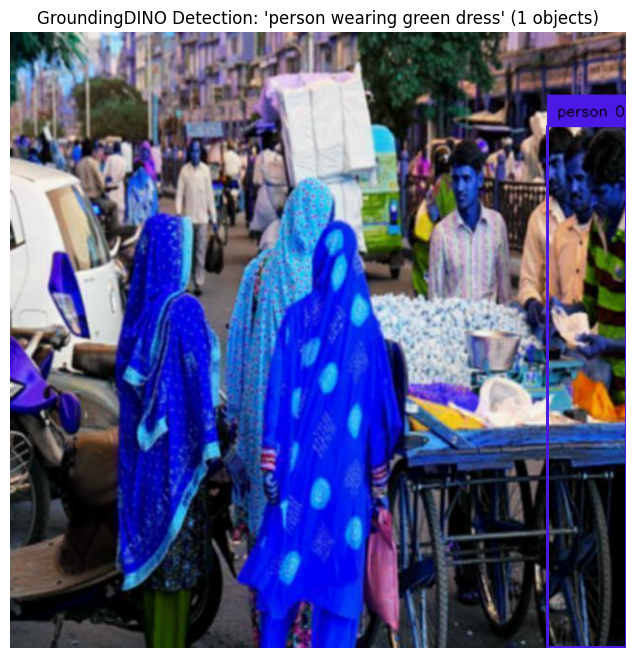


🤖 Gemini Visual Filter...
   Processing 1 detected objects...
   Analyzing object 1/1: 'person'
     Gemini says: YES
     ✅ MATCH!


/tmp/ipython-input-1996539422.py:249: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


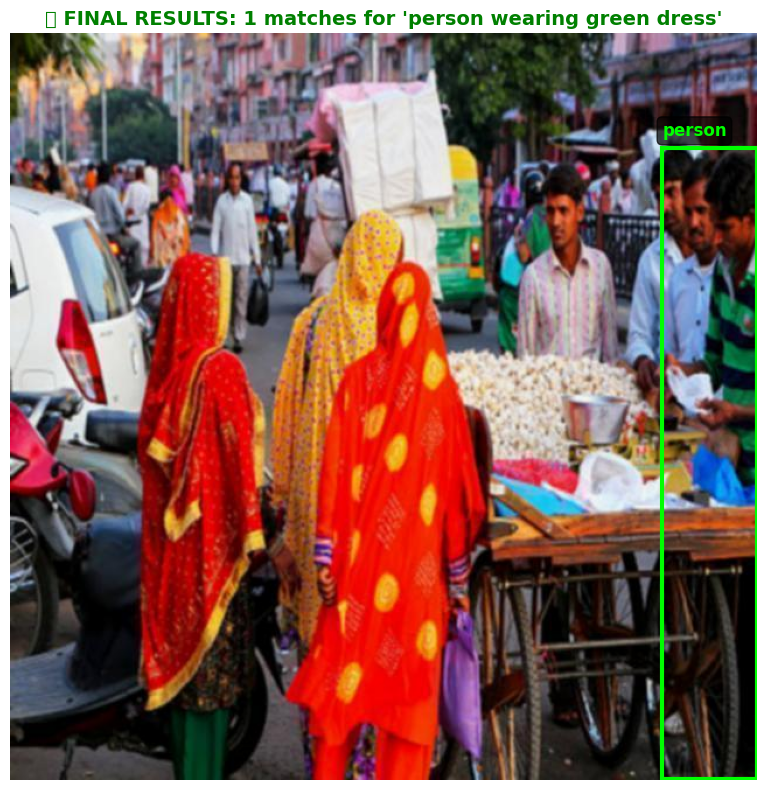


✅ SUCCESS: Found 1 matching object(s)
   1. person


1

In [ ]:
detect_objects("person wearing green dress")

🔍 Searching for: 'person wearing red dress having pink polybag'
📏 Resizing image...
   Resized from (640, 640) to (640, 640)

🎯 GroundingDINO Detection...
   Initial detections: 4
   Kept: 'person' (area: 0.1923)
   After filtering: 1 detections


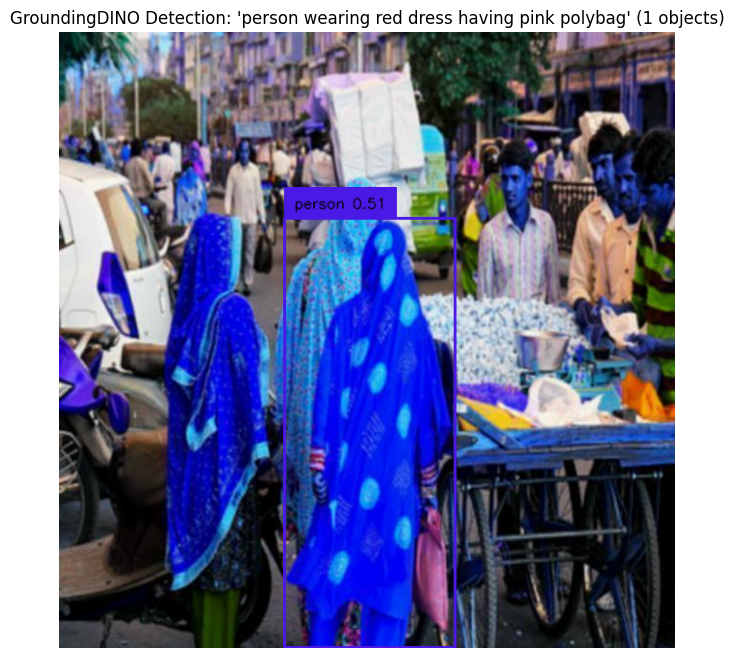


🤖 Gemini Visual Filter...
   Processing 1 detected objects...
   Analyzing object 1/1: 'person'
     Gemini says: YES
     ✅ MATCH!


/tmp/ipython-input-1996539422.py:249: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


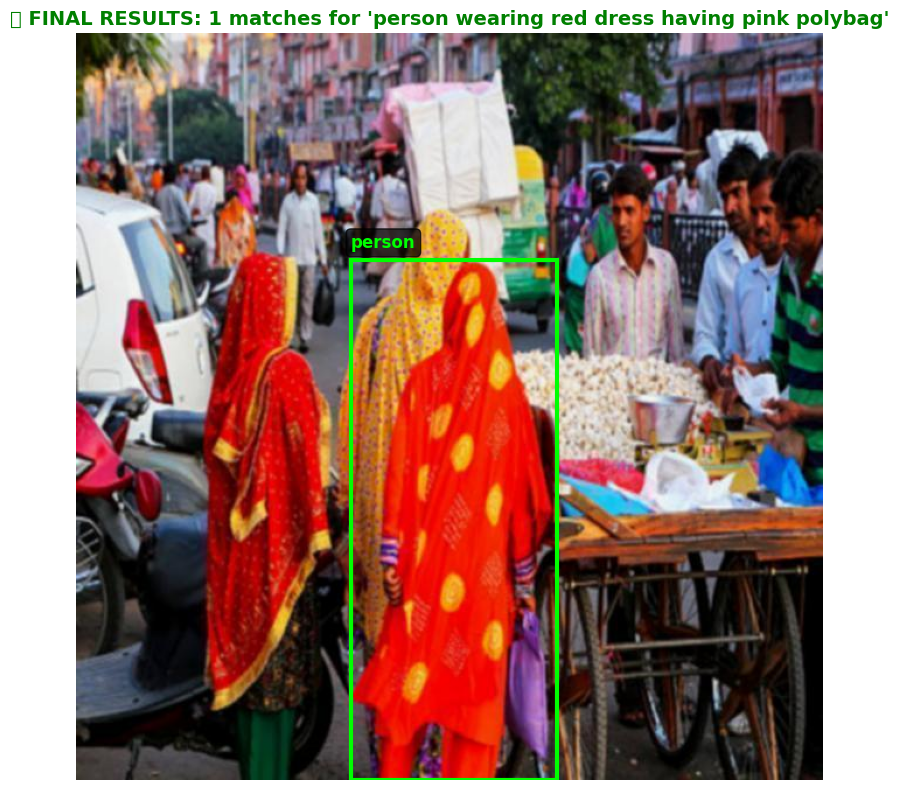


✅ SUCCESS: Found 1 matching object(s)
   1. person


1

In [ ]:
detect_objects("person wearing red dress having pink polybag")

🔍 Searching for: 'person wearing green tshirt with white shoes'
📏 Resizing image...
   Resized from (1280, 720) to (1024, 576)

🎯 GroundingDINO Detection...


/usr/local/lib/python3.11/dist-packages/transformers/modeling_utils.py:1772: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/_dynamo/eval_frame.py:929: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.5 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  return fn(*args, **kwargs)
/usr/local/lib/python3.11/dist-packages/torch/utils/checkpoint.py:85: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/groundingdino/models/GroundingDINO/transformer.py:862: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `

   Initial detections: 1
   After filtering: 1 detections


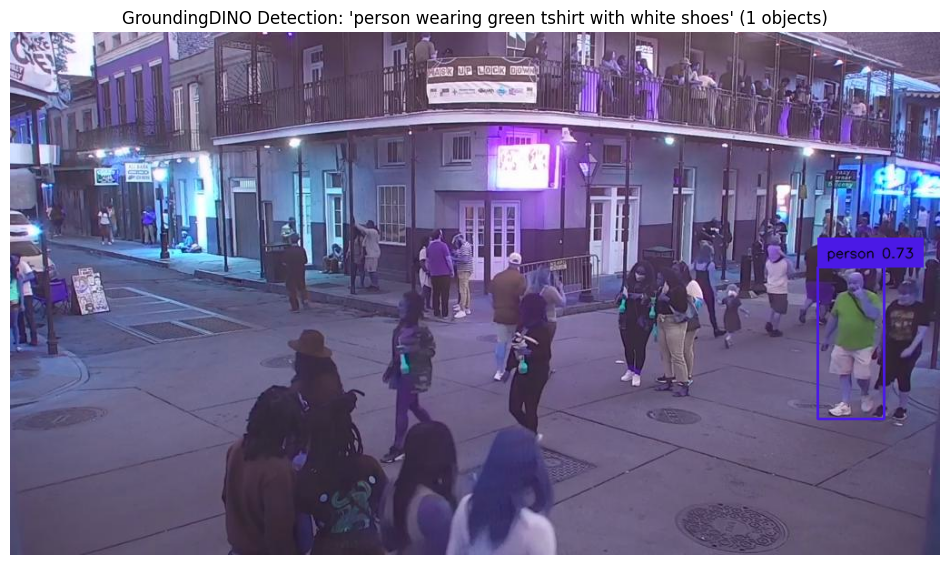


🤖 Gemini Visual Filter...
   Processing 1 detected objects...
   Analyzing object 1/1: 'person'
     Gemini says: YES
     ✅ MATCH!


/tmp/ipython-input-1899455115.py:249: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


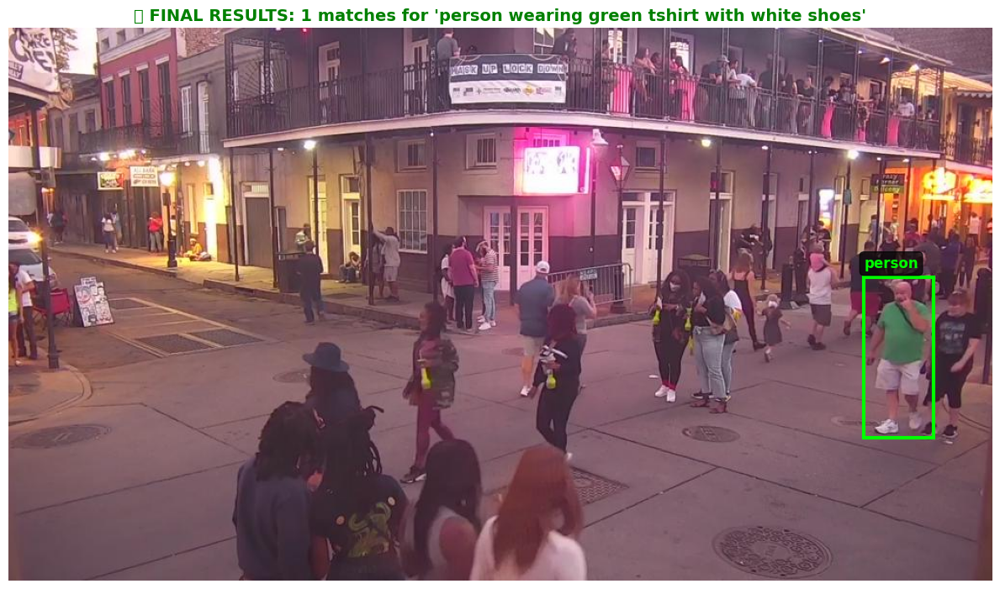


✅ SUCCESS: Found 1 matching object(s)
   1. person


1

In [ ]:
def detect_objects(query, image_path="/content/original.jpg", max_detections=1, debug=False):
    """
    Super simple interface - just provide what you're looking for!

    Args:
        query (str): What to search for (e.g., "person wearing red dress")
        image_path (str): Path to image file
        max_detections (int): Max number of objects to detect initially
        debug (bool): Whether to save debug crop images

    Returns:
        Number of matching objects found
    """
    results = smart_object_detection(image_path, query, max_detections, debug)
    return len(results)

detect_objects("person wearing green tshirt with white shoes")

🔍 Searching for: 'white car behind a pole'
📏 Resizing image...
   Resized from (1024, 576) to (1024, 576)

🎯 GroundingDINO Detection...
   Initial detections: 3
   Kept: 'white car' (area: 0.0045)
   After filtering: 1 detections


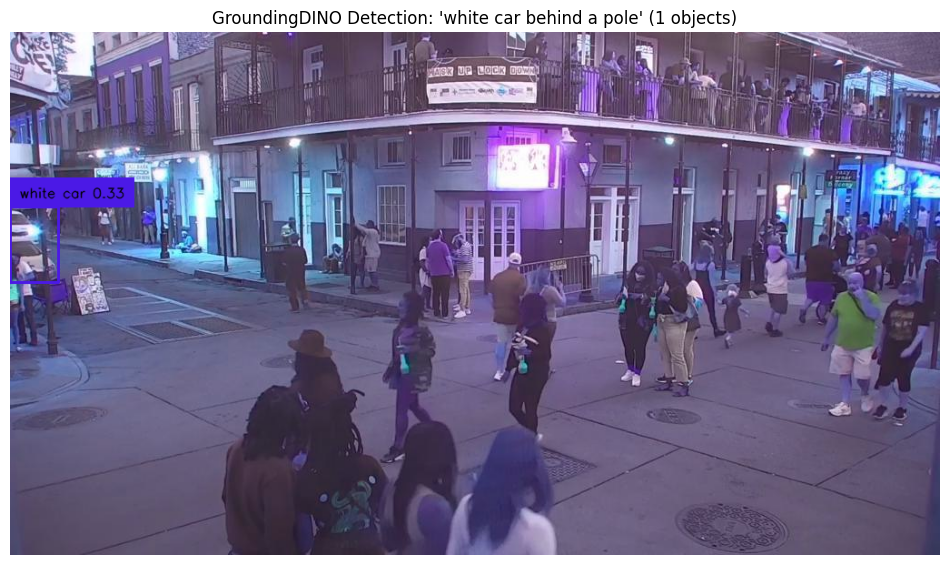


🤖 Gemini Visual Filter...
   Processing 1 detected objects...
   Analyzing object 1/1: 'white car'
     Gemini says: YES
     ✅ MATCH!


/tmp/ipython-input-1899455115.py:249: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


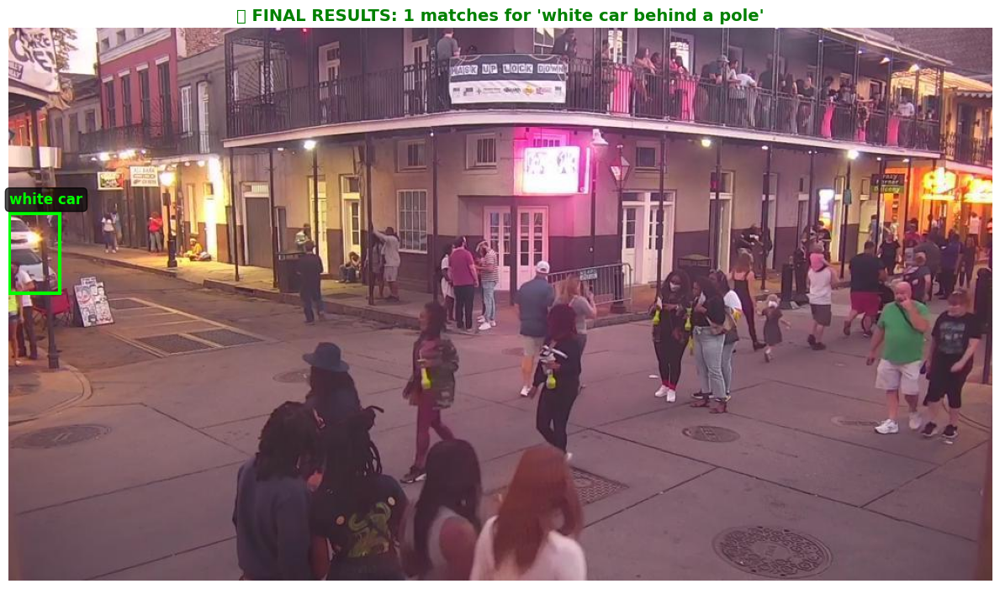


✅ SUCCESS: Found 1 matching object(s)
   1. white car


1

In [ ]:
detect_objects("white car behind a pole")

🔍 Searching for: 'girls present'
📏 Resizing image...
   Resized from (1024, 683) to (1024, 683)

🎯 GroundingDINO Detection...
   Initial detections: 3
   Kept: 'girls' (area: 0.1045)
   After filtering: 1 detections


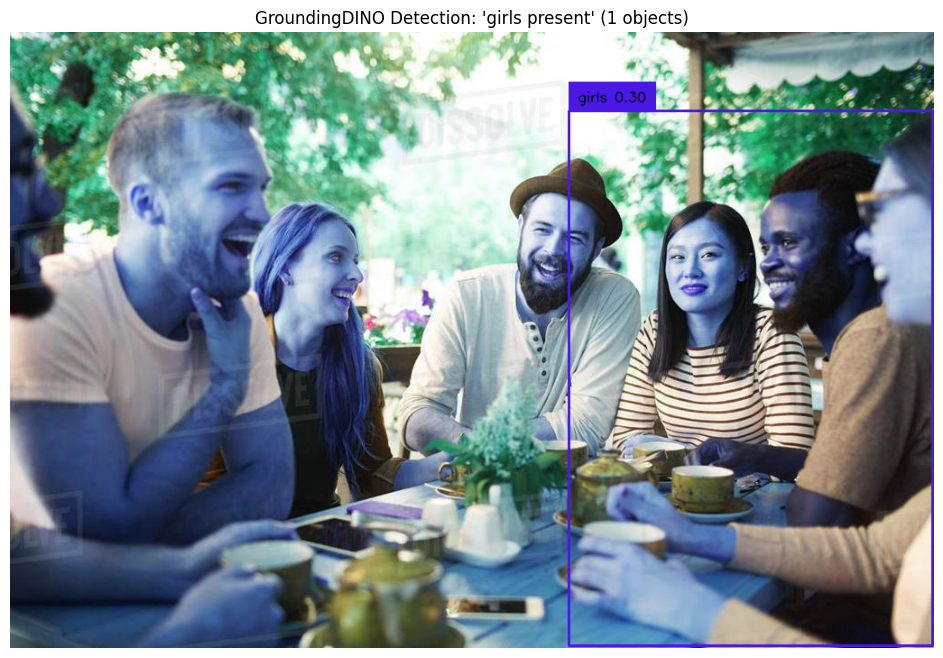


🤖 Gemini Visual Filter...
   Processing 1 detected objects...
   Analyzing object 1/1: 'girls'
     Gemini says: NO
     ❌ No match


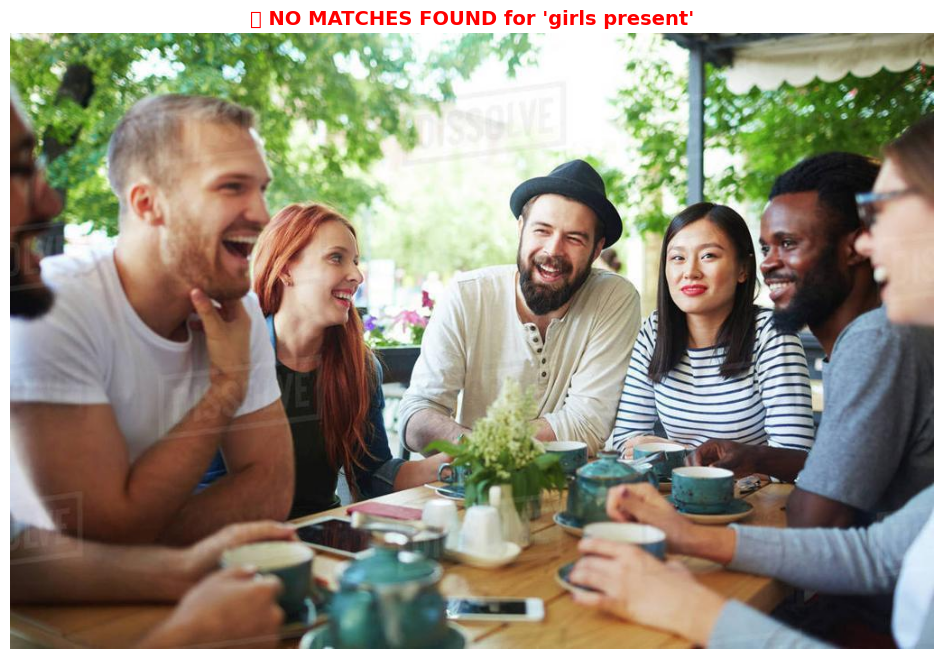


❌ No matching objects found after filtering


0

In [ ]:
def detect_objects(query, image_path="/content/D187_194_011_1200.jpg", max_detections=1, debug=False):
    """
    Super simple interface - just provide what you're looking for!

    Args:
        query (str): What to search for (e.g., "person wearing red dress")
        image_path (str): Path to image file
        max_detections (int): Max number of objects to detect initially
        debug (bool): Whether to save debug crop images

    Returns:
        Number of matching objects found
    """
    results = smart_object_detection(image_path, query, max_detections, debug)
    return len(results)

detect_objects("girls present")

🔍 Searching for: 'person having black bag in his hand and wearing white shirt'
📏 Resizing image...
   Resized from (640, 640) to (640, 640)

🎯 GroundingDINO Detection...
   Initial detections: 2
   Kept: 'person' (area: 0.0041)
   After filtering: 1 detections


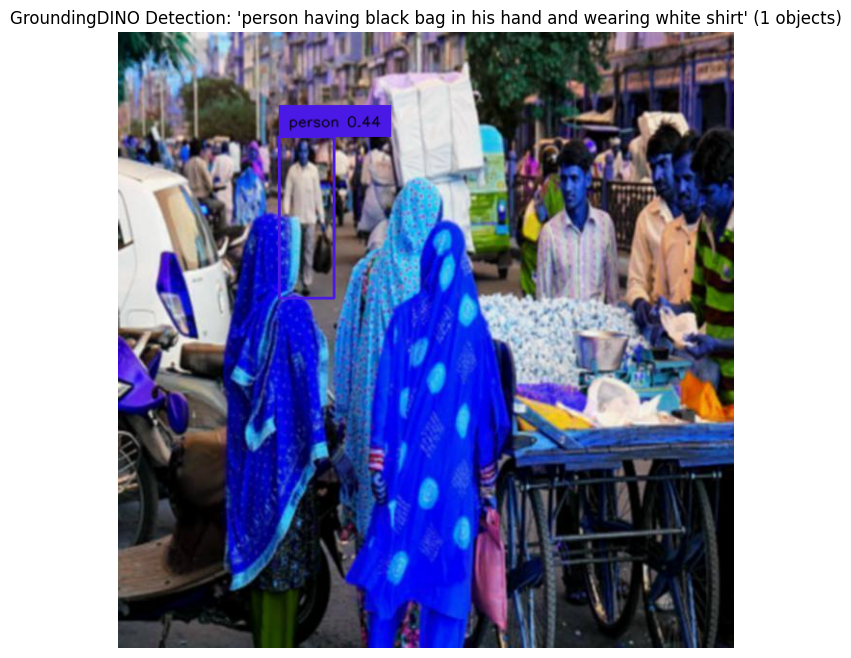


🤖 Gemini Visual Filter...
   Processing 1 detected objects...
   Analyzing object 1/1: 'person'
     Gemini says: YES
     ✅ MATCH!


/tmp/ipython-input-1899455115.py:249: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


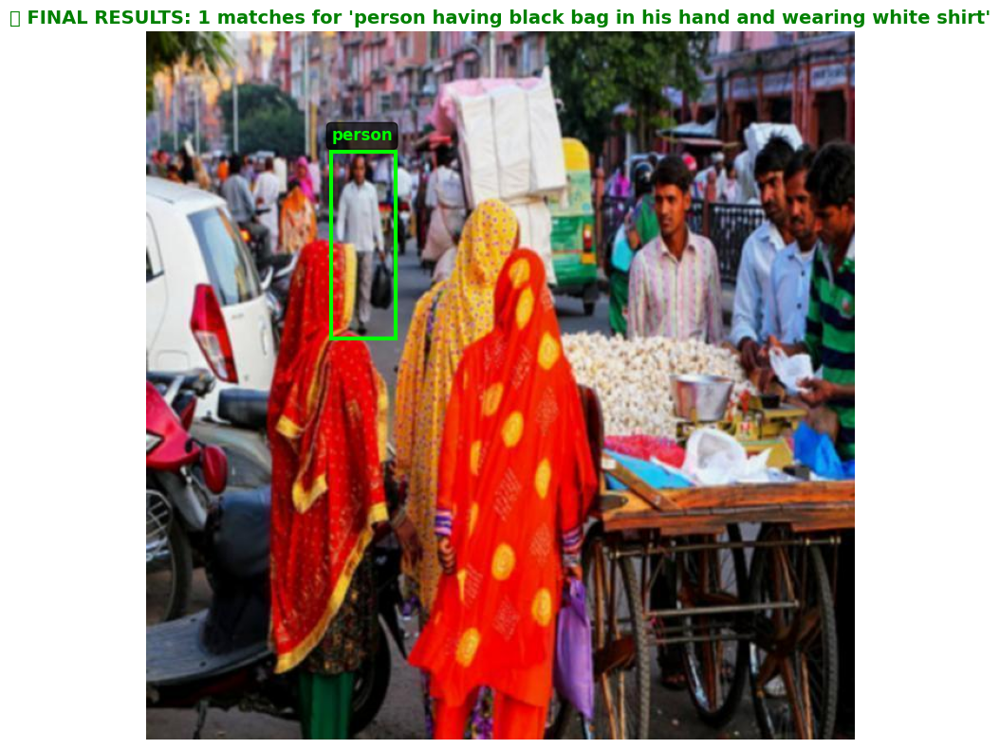


✅ SUCCESS: Found 1 matching object(s)
   1. person


1

In [ ]:
def detect_objects(query, image_path="/content/thumb.jpg", max_detections=1, debug=False):
    """
    Super simple interface - just provide what you're looking for!

    Args:
        query (str): What to search for (e.g., "person wearing red dress")
        image_path (str): Path to image file
        max_detections (int): Max number of objects to detect initially
        debug (bool): Whether to save debug crop images

    Returns:
        Number of matching objects found
    """
    results = smart_object_detection(image_path, query, max_detections, debug)
    return len(results)

detect_objects("person having black bag in his hand and wearing white shirt")

Super Intelligent system

In [ ]:
import time
import json
import re
from datetime import datetime
from google.api_core.exceptions import TooManyRequests
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch
import numpy as np

class SuperIntelligentGeminiDetector:
    def __init__(self):
        self.model_gemini = None
        self.conversation_memory = []
        self.user_preferences = {}
        self.detection_statistics = {}

    def initialize_gemini(self):
        """Initialize Gemini model"""
        if self.model_gemini is None:
            import google.generativeai as genai
            self.model_gemini = genai.GenerativeModel("gemini-2.0-flash")

    def ultra_smart_detect(self, image_path, user_query, **kwargs):
        """
        Ultra-intelligent detection using Gemini's full potential
        """
        self.initialize_gemini()

        print("🧠 GEMINI SUPER-INTELLIGENCE ACTIVATED")
        print("="*60)

        # 1. INTELLIGENT QUERY UNDERSTANDING
        query_analysis = self._analyze_user_intent(user_query)
        print(f"🎯 Intent Analysis: {query_analysis['intent']}")
        print(f"📊 Confidence: {query_analysis['confidence']}")
        print(f"🔍 Key Attributes: {query_analysis['attributes']}")

        # 2. COMPREHENSIVE IMAGE UNDERSTANDING
        full_image_analysis = self._comprehensive_image_analysis(image_path)
        print(f"🖼️ Scene Analysis: {full_image_analysis['scene_description']}")
        print(f"👥 People Count: {full_image_analysis['people_count']}")
        print(f"🎨 Dominant Colors: {full_image_analysis['colors']}")

        # 3. SMART DETECTION WITH GEMINI GUIDANCE
        detection_strategy = self._plan_detection_strategy(query_analysis, full_image_analysis)
        print(f"🎯 Detection Strategy: {detection_strategy}")

        # 4. EXECUTE DETECTION WITH GEMINI OVERSIGHT
        boxes, phrases = self._gemini_guided_detection(image_path, query_analysis, detection_strategy)

        if not boxes:
            # 5. INTELLIGENT FALLBACK STRATEGIES
            return self._intelligent_fallback(image_path, user_query, full_image_analysis)

        # 6. MULTI-PERSPECTIVE ANALYSIS
        candidates = self._multi_perspective_analysis(image_path, boxes, phrases, query_analysis)

        # 7. CONTEXT-AWARE FINAL FILTERING
        final_results = self._context_aware_filtering(candidates, full_image_analysis, query_analysis)

        # 8. INTELLIGENT RESULT EXPLANATION
        self._explain_results(final_results, user_query, full_image_analysis)

        # 9. LEARN FROM INTERACTION
        self._learn_from_detection(user_query, final_results, full_image_analysis)

        return final_results

    def _analyze_user_intent(self, query):
        """Use Gemini to deeply understand what the user is really looking for"""
        intent_prompt = f"""Analyze this search query and extract detailed information:

        Query: "{query}"

        Please provide a JSON response with:
        {{
            "intent": "what the user is primarily looking for",
            "confidence": "how specific/clear the query is (0.0-1.0)",
            "attributes": {{
                "colors": ["list of colors mentioned"],
                "clothing": ["list of clothing items"],
                "objects": ["list of objects/accessories"],
                "person_characteristics": ["age, gender, activity etc"],
                "spatial_relationships": ["location, position clues"]
            }},
            "ambiguities": ["list of unclear aspects"],
            "suggestions": ["suggestions to improve query if needed"],
            "alternative_interpretations": ["other ways to interpret this query"]
        }}

        Be thorough and consider context, synonyms, and implicit meanings."""

        try:
            resp = self.model_gemini.generate_content(intent_prompt)
            # Try to parse JSON, fallback to text analysis if it fails
            try:
                return json.loads(resp.text.strip())
            except:
                # Fallback to basic analysis
                return {
                    "intent": query,
                    "confidence": 0.7,
                    "attributes": {"colors": [], "clothing": [], "objects": []},
                    "raw_response": resp.text
                }
        except Exception as e:
            print(f"⚠️ Intent analysis failed: {e}")
            return {"intent": query, "confidence": 0.5, "attributes": {}}

    def _comprehensive_image_analysis(self, image_path):
        """Gemini analyzes the entire image comprehensively"""
        analysis_prompt = """Analyze this image in extreme detail. Provide a comprehensive JSON response:

        {
            "scene_description": "detailed description of the overall scene",
            "setting": "indoor/outdoor, location type",
            "lighting": "lighting conditions and quality",
            "people_count": "number of people visible",
            "people_details": [
                {
                    "position": "location in image (left, right, center, etc)",
                    "clothing_description": "detailed clothing description",
                    "colors_worn": ["list of colors"],
                    "accessories": ["bags, jewelry, etc"],
                    "activity": "what they appear to be doing",
                    "age_estimate": "approximate age group",
                    "gender": "apparent gender if determinable",
                    "pose": "standing, sitting, walking, etc"
                }
            ],
            "objects_of_interest": ["notable objects, bags, vehicles, etc"],
            "colors": ["dominant colors in the image"],
            "image_quality": "assessment of image clarity, resolution, etc",
            "potential_challenges": ["what might make detection difficult"],
            "notable_features": ["anything unusual or distinctive"]
        }

        Be extremely thorough and observant. Notice small details that might be relevant for object detection."""

        try:
            img = Image.open(image_path)
            resp = self.model_gemini.generate_content([analysis_prompt, img])

            try:
                return json.loads(resp.text.strip())
            except:
                # Fallback parsing
                return {
                    "scene_description": resp.text[:200] + "...",
                    "people_count": "unknown",
                    "colors": ["unknown"],
                    "raw_response": resp.text
                }
        except Exception as e:
            print(f"⚠️ Image analysis failed: {e}")
            return {"scene_description": "Analysis failed", "people_count": 0, "colors": []}

    def _plan_detection_strategy(self, query_analysis, image_analysis):
        """Gemini plans the optimal detection strategy"""
        strategy_prompt = f"""Based on this query analysis and image analysis, plan the optimal object detection strategy:

        QUERY ANALYSIS: {json.dumps(query_analysis, indent=2)}

        IMAGE ANALYSIS: {json.dumps(image_analysis, indent=2)}

        Recommend:
        1. Best detection parameters (box_threshold, text_threshold)
        2. Alternative search terms to try
        3. Potential challenges and how to overcome them
        4. Confidence assessment approach
        5. Fallback strategies if initial detection fails

        Respond in JSON format with actionable recommendations."""

        try:
            resp = self.model_gemini.generate_content(strategy_prompt)
            try:
                return json.loads(resp.text.strip())
            except:
                return {"strategy": resp.text}
        except:
            return {"strategy": "standard detection approach"}

    def _gemini_guided_detection(self, image_path, query_analysis, strategy):
        """Use Gemini's recommendations to guide the detection process"""
        # Extract detection parameters from strategy
        box_threshold = 0.25  # More sensitive initially
        text_threshold = 0.2

        # Try multiple search terms based on Gemini's analysis
        search_terms = [query_analysis['intent']]

        # Add alternative terms from analysis
        if 'alternative_interpretations' in query_analysis:
            search_terms.extend(query_analysis['alternative_interpretations'][:2])

        all_detections = []

        for term in search_terms:
            print(f"🔍 Trying search term: '{term}'")

            image_source, image = load_image(image_path)
            boxes, logits, phrases = predict(
                model=model,
                image=image,
                caption=term,
                box_threshold=box_threshold,
                text_threshold=text_threshold,
                device="cpu"
            )

            print(f"   Found {len(boxes)} detections")

            for box, logit, phrase in zip(boxes, logits, phrases):
                all_detections.append({
                    'box': box,
                    'confidence': float(logit),
                    'phrase': phrase,
                    'search_term': term
                })

        # Deduplicate and select best
        unique_detections = self._deduplicate_detections(all_detections)

        if unique_detections:
            boxes = [d['box'] for d in unique_detections]
            phrases = [d['phrase'] for d in unique_detections]

            # Show initial detections
            if boxes:
                image_source, _ = load_image(image_path)
                logits = torch.tensor([d['confidence'] for d in unique_detections])
                boxes_tensor = torch.stack(boxes) if isinstance(boxes[0], torch.Tensor) else boxes
                annotated_frame = annotate(image_source=image_source, boxes=boxes_tensor, logits=logits, phrases=phrases)

                plt.figure(figsize=(14, 10))
                plt.imshow(annotated_frame)
                plt.title(f"Gemini-Guided Detection: {len(boxes)} candidates found")
                plt.axis('off')
                plt.show()

            return boxes, phrases

        return [], []

    def _multi_perspective_analysis(self, image_path, boxes, phrases, query_analysis):
        """Analyze each detection from multiple perspectives using Gemini"""
        img = Image.open(image_path).convert("RGB")
        img_w, img_h = img.size
        candidates = []

        print(f"🔍 Multi-Perspective Analysis of {len(boxes)} candidates")

        for i, box in enumerate(boxes):
            if isinstance(box, torch.Tensor):
                cx, cy, w, h = box.cpu().numpy()
            else:
                cx, cy, w, h = box

            # Extract crop with some padding
            padding = 0.1  # 10% padding
            x_min = max(0, int((cx - w/2 - padding) * img_w))
            y_min = max(0, int((cy - h/2 - padding) * img_h))
            x_max = min(img_w, int((cx + w/2 + padding) * img_w))
            y_max = min(img_h, int((cy + h/2 + padding) * img_h))

            crop = img.crop((x_min, y_min, x_max, y_max))
            if crop.size[0] > 32 and crop.size[1] > 32:
                crop.thumbnail((600, 600), Image.Resampling.LANCZOS)

            # Multi-perspective analysis
            perspectives = [
                "literal_match",
                "semantic_match",
                "contextual_relevance",
                "visual_quality"
            ]

            candidate_analysis = {
                'box': box,
                'phrase': phrases[i],
                'crop': crop,
                'perspectives': {}
            }

            for perspective in perspectives:
                score = self._analyze_from_perspective(crop, query_analysis, perspective, phrases[i])
                candidate_analysis['perspectives'][perspective] = score
                print(f"   Candidate {i+1} - {perspective}: {score:.2f}")

            # Calculate overall score
            overall_score = np.mean(list(candidate_analysis['perspectives'].values()))
            candidate_analysis['overall_score'] = overall_score

            candidates.append(candidate_analysis)

            time.sleep(1)  # Rate limiting

        return candidates

    def _analyze_from_perspective(self, crop, query_analysis, perspective, detected_phrase):
        """Analyze a crop from a specific perspective using Gemini"""
        perspective_prompts = {
            "literal_match": f"""Look at this image. Does it LITERALLY match this description: "{query_analysis['intent']}"?
            Consider exact colors, clothing types, and objects mentioned. Rate 0.0-1.0 where 1.0 = perfect literal match.
            Detected as: "{detected_phrase}"
            Just respond with a score like: 0.85""",

            "semantic_match": f"""Look at this image. Does it SEMANTICALLY match this description: "{query_analysis['intent']}"?
            Consider similar items, equivalent meanings, and reasonable interpretations. Rate 0.0-1.0.
            Detected as: "{detected_phrase}"
            Just respond with a score like: 0.75""",

            "contextual_relevance": f"""Look at this image. How CONTEXTUALLY RELEVANT is it to: "{query_analysis['intent']}"?
            Consider if this would be what someone searching for this would want to find. Rate 0.0-1.0.
            Detected as: "{detected_phrase}"
            Just respond with a score like: 0.90""",

            "visual_quality": f"""Look at this image. Rate the VISUAL QUALITY for object detection (0.0-1.0).
            Consider clarity, completeness, occlusion, lighting, etc.
            Detected as: "{detected_phrase}"
            Just respond with a score like: 0.80"""
        }

        prompt = perspective_prompts.get(perspective, perspective_prompts["literal_match"])

        try:
            resp = self.model_gemini.generate_content([prompt, crop])
            # Extract numeric score from response
            score_match = re.search(r'(\d+\.?\d*)', resp.text)
            if score_match:
                score = float(score_match.group(1))
                # Normalize to 0-1 range if needed
                if score > 1.0:
                    score = score / 100.0
                return min(max(score, 0.0), 1.0)
            else:
                # Fallback: analyze response text
                response_text = resp.text.lower()
                if any(word in response_text for word in ['excellent', 'perfect', 'exactly']):
                    return 0.9
                elif any(word in response_text for word in ['good', 'matches', 'yes']):
                    return 0.7
                elif any(word in response_text for word in ['partial', 'somewhat', 'maybe']):
                    return 0.5
                else:
                    return 0.3
        except Exception as e:
            print(f"⚠️ Perspective analysis failed for {perspective}: {e}")
            return 0.5

    def _context_aware_filtering(self, candidates, image_analysis, query_analysis):
        """Final filtering using comprehensive context"""
        if not candidates:
            return []

        print(f"🧠 Context-Aware Final Filtering")

        # Sort by overall score
        candidates.sort(key=lambda x: x['overall_score'], reverse=True)

        # Smart filtering based on context
        filtered = []
        min_score = 0.6  # Adjustable threshold

        for candidate in candidates:
            score = candidate['overall_score']
            print(f"   Candidate: {candidate['phrase'][:30]}... Score: {score:.2f}")

            if score >= min_score:
                # Additional context checks
                if self._passes_context_checks(candidate, image_analysis, query_analysis):
                    filtered.append(candidate)
                    print(f"     ✅ ACCEPTED")
                else:
                    print(f"     ❌ Failed context check")
            else:
                print(f"     ❌ Below threshold ({min_score})")

        return filtered

    def _passes_context_checks(self, candidate, image_analysis, query_analysis):
        """Additional context-based checks"""
        # Example context checks (customize based on your needs)

        # Check if detection makes sense in the scene context
        scene_context = image_analysis.get('scene_description', '').lower()
        query_intent = query_analysis['intent'].lower()

        # Simple relevance check
        if 'indoor' in scene_context and 'outdoor' in query_intent:
            return False  # Context mismatch

        # Add more sophisticated checks as needed
        return True

    def _intelligent_fallback(self, image_path, user_query, image_analysis):
        """Intelligent fallback when no objects are detected"""
        print("🤔 No objects detected - activating intelligent fallback")

        fallback_prompt = f"""No objects were detected for the query: "{user_query}"

        Image analysis shows: {image_analysis.get('scene_description', 'Unknown scene')}

        Suggest:
        1. Why detection might have failed
        2. Alternative search terms to try
        3. What the user might actually be looking for
        4. Whether their request is achievable with this image

        Be helpful and constructive."""

        try:
            img = Image.open(image_path)
            resp = self.model_gemini.generate_content([fallback_prompt, img])

            print("💡 Gemini's Suggestions:")
            print(resp.text)

            # You could implement automatic retry with suggested terms here

        except Exception as e:
            print(f"⚠️ Fallback analysis failed: {e}")

        return []

    def _explain_results(self, results, user_query, image_analysis):
        """Generate intelligent explanations for the results"""
        if not results:
            print("\n❌ NO MATCHES FOUND")
            return

        print(f"\n✅ FOUND {len(results)} MATCH(ES)")
        print("="*50)

        for i, result in enumerate(results, 1):
            print(f"🎯 MATCH {i}: {result['phrase']}")
            print(f"   Overall Score: {result['overall_score']:.2f}")
            print(f"   Perspective Scores:")
            for perspective, score in result['perspectives'].items():
                print(f"     • {perspective}: {score:.2f}")

        # Generate explanation using Gemini
        explanation_prompt = f"""The user searched for: "{user_query}"

        We found {len(results)} matches with these details:
        {[{'phrase': r['phrase'], 'score': r['overall_score']} for r in results]}

        In an image showing: {image_analysis.get('scene_description', 'Unknown scene')}

        Provide a brief, user-friendly explanation of:
        1. What we found and why it matches their search
        2. Confidence level in the results
        3. Any limitations or caveats to be aware of"""

        try:
            resp = self.model_gemini.generate_content(explanation_prompt)
            print(f"\n🤖 Gemini's Explanation:")
            print(resp.text)
        except:
            pass

        # Show final visualization
        self._show_final_intelligent_results(Image.open("/content/thumb.jpg"), results, user_query)

    def _show_final_intelligent_results(self, img, results, query):
        """Show final results with intelligent annotations"""
        img_w, img_h = img.size

        if results:
            fig, ax = plt.subplots(1, 1, figsize=(14, 10))
            ax.imshow(img)

            colors = ['lime', 'yellow', 'cyan', 'magenta', 'orange']

            for i, result in enumerate(results):
                box = result['box']
                phrase = result['phrase']
                score = result['overall_score']

                if isinstance(box, torch.Tensor):
                    cx, cy, w, h = box.cpu().numpy()
                else:
                    cx, cy, w, h = box

                x_min = (cx - w / 2) * img_w
                y_min = (cy - h / 2) * img_h
                width = w * img_w
                height = h * img_h

                color = colors[i % len(colors)]

                # Draw rectangle with thickness based on confidence
                thickness = max(2, int(score * 5))
                rect = patches.Rectangle((x_min, y_min), width, height,
                                       linewidth=thickness, edgecolor=color, facecolor='none')
                ax.add_patch(rect)

                # Intelligent label with score
                label = f"{phrase[:20]}... ({score:.2f})"
                ax.text(x_min, y_min - 15, label, fontsize=11, color=color,
                       weight='bold', bbox=dict(boxstyle="round,pad=0.3", facecolor="black", alpha=0.8))

            ax.set_title(f"🧠 SUPER-INTELLIGENT RESULTS: {len(results)} matches for '{query}'",
                        fontsize=14, color='green', weight='bold')
            ax.axis('off')
            plt.tight_layout()
            plt.show()

    def _learn_from_detection(self, query, results, image_analysis):
        """Learn from this detection for future improvements"""
        self.conversation_memory.append({
            'timestamp': datetime.now().isoformat(),
            'query': query,
            'results_count': len(results),
            'success': len(results) > 0,
            'scene_type': image_analysis.get('setting', 'unknown')
        })

        # Update statistics
        success_key = 'successful_detections' if results else 'failed_detections'
        self.detection_statistics[success_key] = self.detection_statistics.get(success_key, 0) + 1

        print(f"📚 Learning complete. Total successful: {self.detection_statistics.get('successful_detections', 0)}")

    def _deduplicate_detections(self, detections):
        """Remove duplicate detections using IoU"""
        if len(detections) <= 1:
            return detections

        # Sort by confidence
        detections.sort(key=lambda x: x['confidence'], reverse=True)

        unique = []
        for detection in detections:
            is_duplicate = False
            for existing in unique:
                if self._calculate_iou_dict(detection, existing) > 0.5:
                    is_duplicate = True
                    break

            if not is_duplicate:
                unique.append(detection)

        return unique[:3]  # Keep top 3

    def _calculate_iou_dict(self, det1, det2):
        """Calculate IoU between two detection dictionaries"""
        box1 = det1['box']
        box2 = det2['box']

        if isinstance(box1, torch.Tensor):
            cx1, cy1, w1, h1 = box1.cpu().numpy()
        else:
            cx1, cy1, w1, h1 = box1

        if isinstance(box2, torch.Tensor):
            cx2, cy2, w2, h2 = box2.cpu().numpy()
        else:
            cx2, cy2, w2, h2 = box2

        # Convert to corner coordinates and calculate IoU
        x1_min, y1_min = cx1 - w1/2, cy1 - h1/2
        x1_max, y1_max = cx1 + w1/2, cy1 + h1/2
        x2_min, y2_min = cx2 - w2/2, cy2 - h2/2
        x2_max, y2_max = cx2 + w2/2, cy2 + h2/2

        inter_x_min = max(x1_min, x2_min)
        inter_y_min = max(y1_min, y2_min)
        inter_x_max = min(x1_max, x2_max)
        inter_y_max = min(y1_max, y2_max)

        if inter_x_max <= inter_x_min or inter_y_max <= inter_y_min:
            return 0.0

        inter_area = (inter_x_max - inter_x_min) * (inter_y_max - inter_y_min)
        area1 = w1 * h1
        area2 = w2 * h2
        union_area = area1 + area2 - inter_area

        return inter_area / union_area if union_area > 0 else 0.0

**Query**

In [ ]:
def super_smart_detect(query, image_path="/content/thumb.jpg"):
    """
    One-line super intelligent detection
    """
    detector = SuperIntelligentGeminiDetector()
    return detector.ultra_smart_detect(image_path, query)

🧠 GEMINI SUPER-INTELLIGENCE ACTIVATED
🎯 Intent Analysis: person wearing white shirt and having black bag in his hand
📊 Confidence: 0.7
🔍 Key Attributes: {'colors': [], 'clothing': [], 'objects': []}
🖼️ Scene Analysis: ```json
{
    "scene_description": "A bustling street scene in what appears to be India. Several people are walking or standing, with a vendor selling what looks like puffed rice. The architecture in ...
👥 People Count: unknown
🎨 Dominant Colors: ['unknown']
🎯 Detection Strategy: {'strategy': '```json\n{\n  "object_detection_strategy": {\n    "best_detection_parameters": {\n      "box_threshold": 0.35,\n      "text_threshold": 0.25,\n      "explanation": "Given the cluttered scene and potential for similar colors in the image, a slightly lower box threshold may help detect more potential matches. The text threshold is reduced slightly to improve the chances of detecting text possibly associated with vendors or signs related to clothing/bags, which could indirectly aid in 

/usr/local/lib/python3.11/dist-packages/transformers/modeling_utils.py:1772: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/_dynamo/eval_frame.py:929: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.5 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  return fn(*args, **kwargs)
/usr/local/lib/python3.11/dist-packages/torch/utils/checkpoint.py:85: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/groundingdino/models/GroundingDINO/transformer.py:862: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `

   Found 4 detections


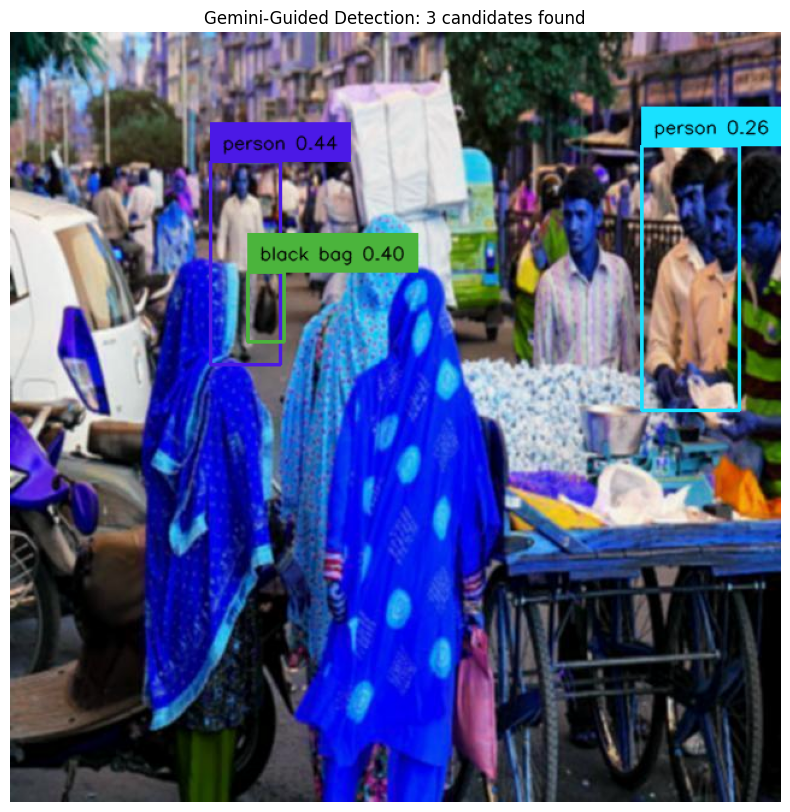

🔍 Multi-Perspective Analysis of 3 candidates
   Candidate 1 - literal_match: 0.95
   Candidate 1 - semantic_match: 0.90
   Candidate 1 - contextual_relevance: 0.95
   Candidate 1 - visual_quality: 0.65
   Candidate 2 - literal_match: 0.95
   Candidate 2 - semantic_match: 0.90
   Candidate 2 - contextual_relevance: 0.95
   Candidate 2 - visual_quality: 0.75
   Candidate 3 - literal_match: 0.65
   Candidate 3 - semantic_match: 0.60
   Candidate 3 - contextual_relevance: 0.75
   Candidate 3 - visual_quality: 0.75
🧠 Context-Aware Final Filtering
   Candidate: black bag... Score: 0.89
     ✅ ACCEPTED
   Candidate: person... Score: 0.86
     ✅ ACCEPTED
   Candidate: person... Score: 0.69
     ✅ ACCEPTED

✅ FOUND 3 MATCH(ES)
🎯 MATCH 1: black bag
   Overall Score: 0.89
   Perspective Scores:
     • literal_match: 0.95
     • semantic_match: 0.90
     • contextual_relevance: 0.95
     • visual_quality: 0.75
🎯 MATCH 2: person
   Overall Score: 0.86
   Perspective Scores:
     • literal_match: 0.

/tmp/ipython-input-1844340068.py:509: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


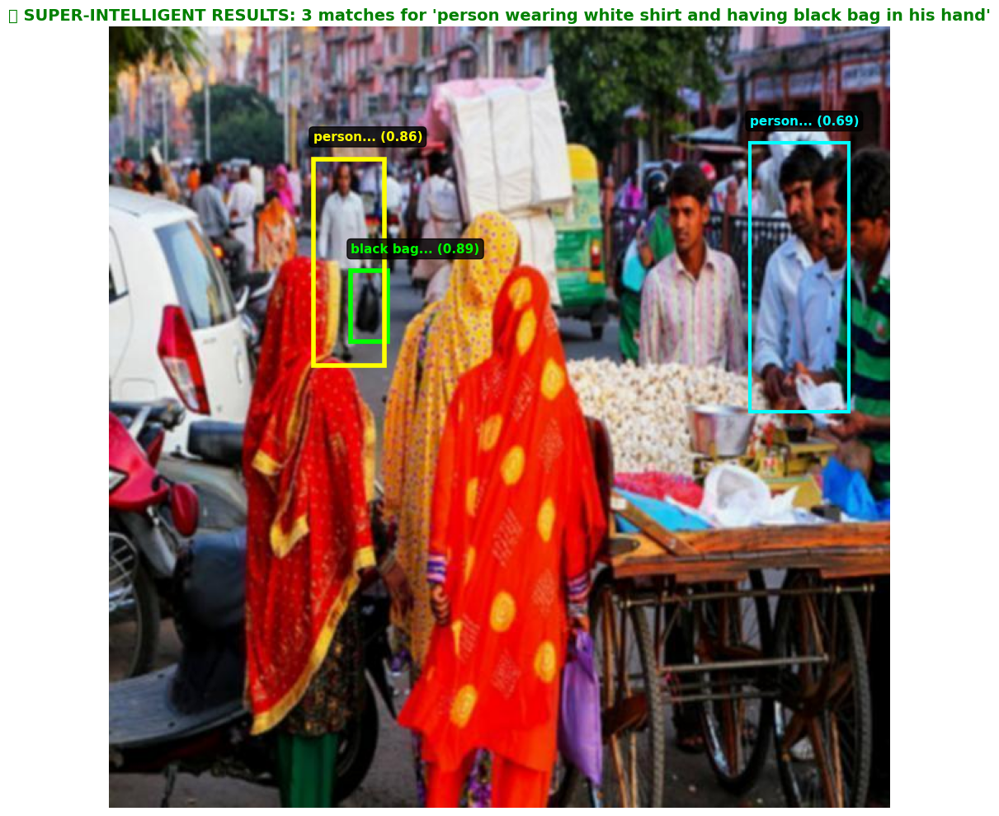

📚 Learning complete. Total successful: 1


[{'box': tensor([0.3326, 0.3570, 0.0472, 0.0902]),
  'phrase': 'black bag',
  'crop': <PIL.Image.Image image mode=RGB size=158x186>,
  'perspectives': {'literal_match': 0.95,
   'semantic_match': 0.9,
   'contextual_relevance': 0.95,
   'visual_quality': 0.75},
  'overall_score': np.float64(0.8875)},
 {'box': tensor([0.3060, 0.3006, 0.0910, 0.2641]),
  'phrase': 'person',
  'crop': <PIL.Image.Image image mode=RGB size=186x297>,
  'perspectives': {'literal_match': 0.95,
   'semantic_match': 0.9,
   'contextual_relevance': 0.95,
   'visual_quality': 0.65},
  'overall_score': np.float64(0.8624999999999999)},
 {'box': tensor([0.8830, 0.3201, 0.1270, 0.3439]),
  'phrase': 'person',
  'crop': <PIL.Image.Image image mode=RGB size=180x348>,
  'perspectives': {'literal_match': 0.65,
   'semantic_match': 0.6,
   'contextual_relevance': 0.75,
   'visual_quality': 0.75},
  'overall_score': np.float64(0.6875)}]

In [ ]:
super_smart_detect("person wearing white shirt and having black bag in his hand")